## 🧠 Entrenamiento desde cero con YOLOv8

Este notebook sigue el flujo de trabajo completo para entrenar un modelo YOLOv8 personalizado. Aquí iniciamos con los siguientes pasos:

### ✅ Paso 1: Clonar YOLOv8
Se clona el repositorio oficial de Ultralytics y se instala en modo editable (`pip install -e .`) para tener acceso completo a sus funcionalidades desde código Python.

### ✅ Paso 2: Preparar el dataset
Debes subir un archivo `.zip` que contenga solo imágenes. El código extrae las imágenes y las divide automáticamente en un conjunto de entrenamiento (`train`) y uno de validación (`valid`), organizándolos en carpetas necesarias para YOLOv8:



In [2]:
# 🚀 Clonar el repositorio oficial de YOLOv8
!git clone https://github.com/ultralytics/ultralytics.git
%cd ultralytics
!pip install -e .  # Instalar en modo editable


Cloning into 'ultralytics'...
remote: Enumerating objects: 59504, done.
remote: Counting objects: 100% (138/138), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 59504 (delta 101), reused 60 (delta 60), pack-reused 59366 (from 4)
Receiving objects: 100% (59504/59504), 32.48 MiB | 22.16 MiB/s, done.
Resolving deltas: 100% (44222/44222), done.
/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.137-0.editable-py3-none-any.whl size=23085 sha256=0df10bc8f74ab7ce7489932a5e6b3c8a2c24b5350521f2458eb8c30a5f14b72e
  Stored in directory: /tmp/pip-ephem-wheel-cache-vj9awc19/wheels/ea/71/6b/a9012dfb148489fd8125c2310e565414c996b3c7721defe799
Success

In [3]:
from google.colab import files

print("📁 Por favor selecciona tu archivo .zip que contiene images/, labels/ y data.yaml")
uploaded = files.upload()


📁 Por favor selecciona tu archivo .zip que contiene images/, labels/ y data.yaml


Saving Archive.zip to Archive.zip


In [ ]:
import zipfile
import os

# Nombre del archivo que subiste
zip_path = "Archive.zip"
extract_path = "/content/hockeyv8"

# Extraer
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Verificar contenido
for root, dirs, files in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    for f in files:
        print(f"{indent}  {f}")


In [6]:
import os
import shutil

# Crear estructura limpia dentro del entorno accesible
src_base = "./hockeyv8"
target_base = "./hockeyv8_clean"
images_dir = os.path.join(target_base, "images")
labels_dir = os.path.join(target_base, "labels")

# Crear carpetas destino
os.makedirs(images_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True)

# Función para mover imágenes y etiquetas ignorando archivos ocultos de macOS
def move_files(src_root, dst_root, valid_exts):
    for root, _, files in os.walk(src_root):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_exts) and not file.startswith("._"):
                shutil.copy2(os.path.join(root, file), os.path.join(dst_root, file))

# Mover archivos
move_files(src_base, images_dir, [".jpg", ".jpeg", ".png"])
move_files(src_base, labels_dir, [".txt"])

# Mostrar un resumen
import pandas as pd
image_files = sorted(os.listdir(images_dir))[:10]
label_files = sorted(os.listdir(labels_dir))[:10]
pd.DataFrame({"Imágenes": image_files, "Etiquetas": label_files})


,Imágenes,Etiquetas


In [7]:
import os, shutil
from glob import glob
from sklearn.model_selection import train_test_split

# 📁 Rutas
root = "/content/hockeyv8_clean"
images = sorted(glob("/content/hockeyv8/images/*.jpg"))
labels = sorted(glob("/content/hockeyv8/labels/*.txt"))

# 🧪 División
train_img, test_img, train_lbl, test_lbl = train_test_split(images, labels, test_size=0.2, random_state=42)
val_img, test_img, val_lbl, test_lbl = train_test_split(test_img, test_lbl, test_size=0.5, random_state=42)

# 📂 Carpetas destino
splits = ['train', 'valid', 'test']
for s in splits:
    os.makedirs(f"{root}/{s}/images", exist_ok=True)
    os.makedirs(f"{root}/{s}/labels", exist_ok=True)

# 📤 Función para copiar
def move_files(imgs, lbls, split):
    for img, lbl in zip(imgs, lbls):
        shutil.copy(img, f"{root}/{split}/images/")
        shutil.copy(lbl, f"{root}/{split}/labels/")

# ✅ Copiar archivos
move_files(train_img, train_lbl, "train")
move_files(val_img, val_lbl, "valid")
move_files(test_img, test_lbl, "test")


## 📄 ¿Qué es el archivo `data.yaml` en YOLOv8?

El archivo `data.yaml` es un componente **esencial** para entrenar modelos de detección de objetos con YOLOv8. Define la estructura del dataset y proporciona la información necesaria para que el modelo sepa:

- **Dónde están las imágenes de entrenamiento, validación y prueba**
- **Cuántas clases hay**
- **Cómo se llaman las clases**

---

### 📁 Estructura típica del archivo `data.yaml`

```yaml
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['disco', 'jugador']


In [8]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
model.train(
    data="/content/hockeyv8_clean/data.yaml",
    epochs=30,
    imgsz=640,
    batch=8,
    name="hockey_yolov8",
    project="hockey_project"
)


100%|██████████| 6.25M/6.25M [00:00<00:00, 257MB/s]

Ultralytics 8.3.137 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/hockeyv8_clean/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=hockey_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pr

  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 

train: Scanning /content/hockeyv8_clean/train/labels... 89 images, 0 backgrounds, 0 corrupt: 100%|██████████| 89/89 [00:00<00:00, 1464.38it/s]

train: New cache created: /content/hockeyv8_clean/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.3±0.7 ms, read: 2870.9±507.6 MB/s, size: 1009.5 KB)


val: Scanning /content/hockeyv8_clean/valid/labels... 11 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11/11 [00:00<00:00, 26169.79it/s]

val: New cache created: /content/hockeyv8_clean/valid/labels.cache
Plotting labels to hockey_project/hockey_yolov8/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to hockey_project/hockey_yolov8
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G      1.523      2.862      1.226          3        640: 100%|██████████| 12/12 [01:18<00:00,  6.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.00s/it]

                   all         11         38    0.00866      0.455       0.29      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G      1.549      1.816      1.222          6        640: 100%|██████████| 12/12 [01:12<00:00,  6.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.83s/it]

                   all         11         38      0.958      0.166      0.344      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30         0G      1.618      1.734      1.211          3        640: 100%|██████████| 12/12 [01:12<00:00,  6.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]

                   all         11         38      0.897      0.175      0.324       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30         0G      1.519      1.644      1.236          6        640: 100%|██████████| 12/12 [01:10<00:00,  5.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.18s/it]

                   all         11         38      0.951      0.139      0.313      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30         0G      1.522      1.617      1.185         11        640: 100%|██████████| 12/12 [01:11<00:00,  5.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.71s/it]

                   all         11         38      0.816       0.13      0.247      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30         0G      1.523      1.723       1.22          1        640: 100%|██████████| 12/12 [01:12<00:00,  6.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.74s/it]

                   all         11         38       0.86      0.258       0.34      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         0G      1.638      1.648       1.31          2        640: 100%|██████████| 12/12 [01:10<00:00,  5.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]

                   all         11         38      0.878      0.273      0.429      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30         0G      1.468      1.465      1.189          3        640: 100%|██████████| 12/12 [01:10<00:00,  5.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]

                   all         11         38      0.868      0.273       0.36       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30         0G      1.545      1.429      1.247          8        640: 100%|██████████| 12/12 [01:12<00:00,  6.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.83s/it]

                   all         11         38      0.789      0.379      0.543      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30         0G      1.527      1.399      1.248          3        640: 100%|██████████| 12/12 [01:12<00:00,  6.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]

                   all         11         38      0.815      0.524      0.589      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30         0G      1.539      1.462      1.234          7        640: 100%|██████████| 12/12 [01:11<00:00,  5.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]

                   all         11         38      0.909      0.733      0.743      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30         0G      1.494      1.458      1.215          6        640: 100%|██████████| 12/12 [01:11<00:00,  5.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]

                   all         11         38      0.904      0.716      0.734      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30         0G      1.447      1.265      1.158          9        640: 100%|██████████| 12/12 [01:11<00:00,  5.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.68s/it]

                   all         11         38      0.703      0.594      0.621      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30         0G      1.524       1.38       1.25          3        640: 100%|██████████| 12/12 [01:12<00:00,  6.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.56s/it]

                   all         11         38      0.676      0.579      0.634      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30         0G      1.434      1.304      1.154          3        640: 100%|██████████| 12/12 [01:13<00:00,  6.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]

                   all         11         38      0.633      0.627      0.566      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30         0G      1.522      1.318      1.176         10        640: 100%|██████████| 12/12 [01:12<00:00,  6.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]

                   all         11         38      0.532      0.655      0.577      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30         0G      1.405      1.345      1.212          7        640: 100%|██████████| 12/12 [01:11<00:00,  5.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]

                   all         11         38      0.883      0.639       0.67      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30         0G      1.451      1.283      1.171          7        640: 100%|██████████| 12/12 [01:12<00:00,  6.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]

                   all         11         38      0.932      0.639      0.674      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30         0G      1.458      1.386      1.179          1        640: 100%|██████████| 12/12 [01:14<00:00,  6.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]

                   all         11         38      0.789      0.624      0.627      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30         0G      1.442      1.269      1.214          8        640: 100%|██████████| 12/12 [01:14<00:00,  6.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]

                   all         11         38      0.754      0.629      0.655      0.261


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30         0G      1.327      1.332      1.129          3        640: 100%|██████████| 12/12 [01:12<00:00,  6.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]

                   all         11         38       0.74      0.606      0.618      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30         0G      1.307      1.354      1.116          1        640: 100%|██████████| 12/12 [01:14<00:00,  6.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]

                   all         11         38      0.733      0.579      0.582      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30         0G      1.384      1.362      1.136          2        640: 100%|██████████| 12/12 [01:13<00:00,  6.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]

                   all         11         38      0.644      0.724       0.64      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30         0G      1.375      1.266       1.13          6        640: 100%|██████████| 12/12 [01:13<00:00,  6.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]

                   all         11         38      0.738      0.624      0.657      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30         0G      1.267       1.27      1.108          3        640: 100%|██████████| 12/12 [01:13<00:00,  6.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]

                   all         11         38      0.675       0.73      0.659      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30         0G      1.326      1.255      1.112          3        640: 100%|██████████| 12/12 [01:13<00:00,  6.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]

                   all         11         38      0.853      0.726      0.709      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30         0G      1.209      1.185      1.086          1        640: 100%|██████████| 12/12 [01:12<00:00,  6.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]

                   all         11         38      0.777      0.624      0.622      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30         0G      1.249       1.17      1.065          2        640: 100%|██████████| 12/12 [01:11<00:00,  5.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]

                   all         11         38      0.771      0.624      0.623      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30         0G      1.215       1.15      1.057          2        640: 100%|██████████| 12/12 [01:11<00:00,  5.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]

                   all         11         38      0.554       0.67      0.563      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30         0G      1.243      1.206      1.094          2        640: 100%|██████████| 12/12 [01:13<00:00,  6.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]

                   all         11         38      0.551       0.67      0.564      0.286



30 epochs completed in 0.632 hours.
Optimizer stripped from hockey_project/hockey_yolov8/weights/last.pt, 6.2MB
Optimizer stripped from hockey_project/hockey_yolov8/weights/best.pt, 6.2MB

Validating hockey_project/hockey_yolov8/weights/best.pt...
Ultralytics 8.3.137 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


                   all         11         38      0.909      0.736      0.743      0.305
                 disco          3          5          1      0.592      0.597      0.188
               jugador         11         33      0.817      0.879      0.889      0.421
Speed: 1.8ms preprocess, 162.0ms inference, 0.0ms loss, 12.3ms postprocess per image
Results saved to hockey_project/hockey_yolov8


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a2a367b7fd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

# 📊 Explicación de los Resultados de Entrenamiento (YOLOv8)

Durante el entrenamiento de **30 épocas (epochs)**, el modelo reporta las siguientes métricas por lote:

| Métrica    | Significado |
|------------|-------------|
| `box_loss` | Pérdida por error en la predicción de las cajas delimitadoras. Valores más bajos son mejores. |
| `cls_loss` | Pérdida por error en la clasificación del objeto detectado. |
| `dfl_loss` | Distance Focal Loss: ayuda a refinar la precisión del borde de las cajas. |
| `Instances` | Número promedio de objetos por imagen en el lote actual. |
| `Size`     | Tamaño de entrada de la imagen (ej. 640x640). |

---

Después de cada época, se evalúa el modelo sobre el conjunto de validación con las siguientes métricas:

| Campo        | Significado |
|--------------|-------------|
| `Box(P)`     | Precisión: de todas las predicciones que el modelo hizo, ¿cuántas fueron correctas? |
| `R` (Recall) | Recall: de todos los objetos verdaderos, ¿cuántos detectó el modelo? |
| `mAP@0.5`    | Media de precisión para un umbral de IoU = 0.5 (más tolerante). |
| `mAP@0.5:0.95` | mAP promedio entre IoU=0.5 e IoU=0.95 (más exigente). |

---

## 🎯 Resultado Final

El modelo alcanzó:

- **Precisión (P)**: `0.909` → 🔹 *Muy alto*  
- **Recall (R)**: `0.736` → 🔹 *Bastante bueno*  
- **mAP@0.5**: `0.743` → 🔹 *Buena capacidad de detección*  
- **mAP@0.5:0.95**: `0.305` → ⚠️ *Aún tiene margen de mejora en localización precisa*

---

## 📁 Por Clases

| Clase    | mAP@0.5 | mAP@0.5:0.95 |
|----------|---------|---------------|
| `disco`  | 0.597   | 0.188         |
| `jugador`| 0.889   | 0.421         |



image 1/1 /content/hockeyv8_clean/valid/images/IMG_1003_png.rf.052ab81809a7ee912983c9b977b27705.jpg: 480x640 3 jugadors, 374.7ms
Speed: 31.5ms preprocess, 374.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/ultralytics/runs/detect/predict2


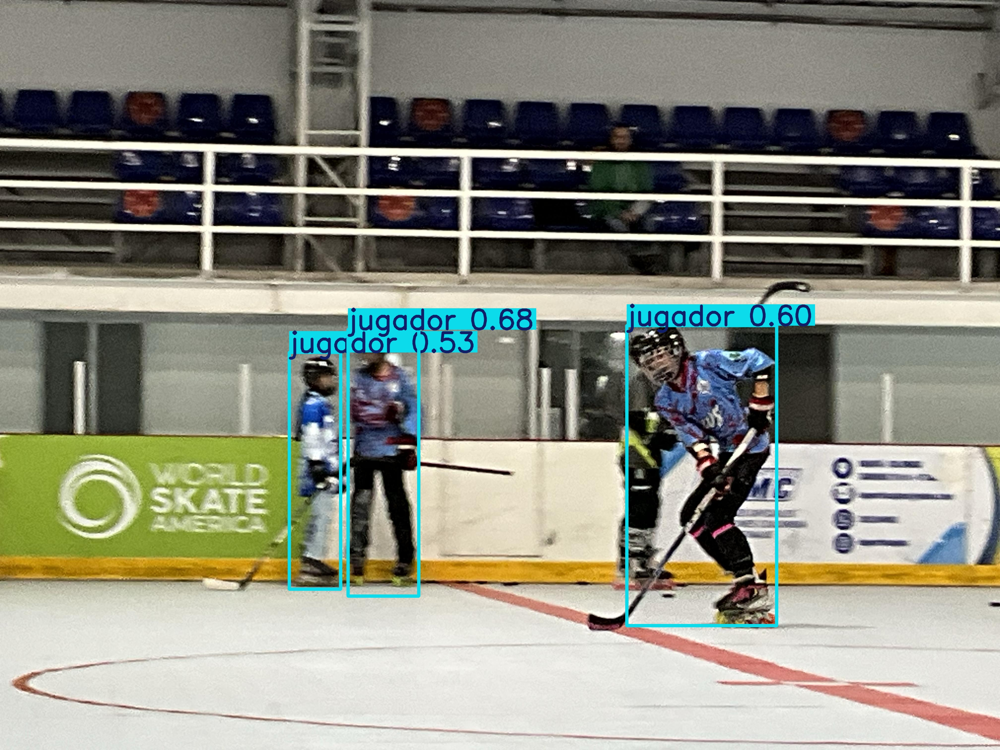

In [11]:
from ultralytics import YOLO
from PIL import Image
import IPython.display as display
import os

# Cargar el modelo entrenado
model = YOLO("hockey_project/hockey_yolov8/weights/best.pt")

# Cambia el path por una imagen real de validación
image_path = "/content/hockeyv8_clean/valid/images/IMG_1003_png.rf.052ab81809a7ee912983c9b977b27705.jpg"

# Realizar inferencia
results = model(image_path, save=True, conf=0.25)

# Mostrar imagen con predicciones (ya guardada por YOLO)
pred_img_path = os.path.join(results[0].save_dir, os.path.basename(image_path))
display.display(Image.open(pred_img_path))


Ultralytics 8.3.137 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1297.3±783.1 MB/s, size: 1085.6 KB)


val: Scanning /content/hockeyv8_clean/valid/labels.cache... 11 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11/11 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.99s/it]


                   all         11         38      0.909      0.736      0.743      0.305
                 disco          3          5          1      0.592      0.597      0.188
               jugador         11         33      0.817      0.879      0.889      0.421
Speed: 4.1ms preprocess, 220.4ms inference, 0.0ms loss, 12.1ms postprocess per image
Results saved to /content/ultralytics/runs/detect/val


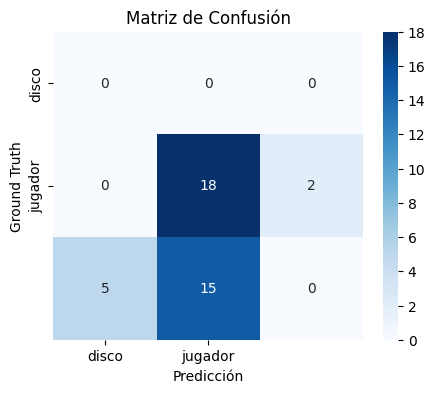

In [13]:
metrics = model.val()  # calcula métricas
cm = metrics.confusion_matrix.matrix  # matriz NxN

import seaborn as sns
import numpy as np

labels = ['disco', 'jugador']
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='.0f', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Ground Truth')
plt.title('Matriz de Confusión')
plt.show()


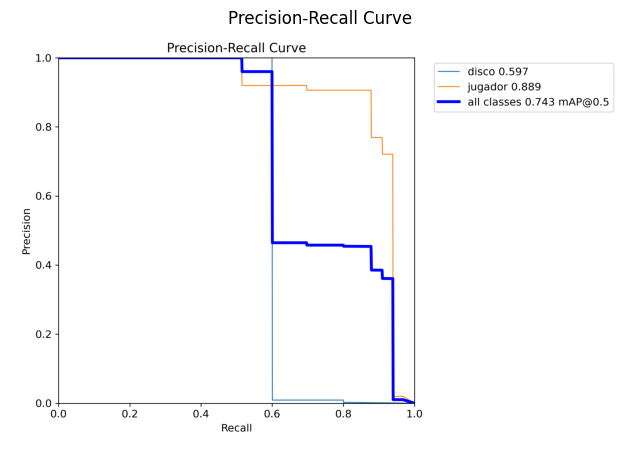

In [17]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread('hockey_project/hockey_yolov8/PR_curve.png')
plt.figure(figsize=(8,6))
plt.imshow(img)
plt.axis('off')
plt.title('Precision-Recall Curve')
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


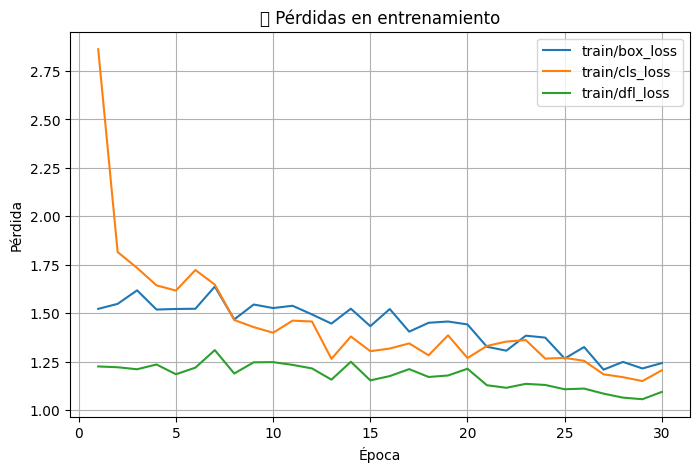

In [20]:
import matplotlib.pyplot as plt

df[["epoch", "train/box_loss", "train/cls_loss", "train/dfl_loss"]].plot(
    x="epoch", title="📉 Pérdidas en entrenamiento", figsize=(8,5)
)
plt.grid(True)
plt.xlabel("Época")
plt.ylabel("Pérdida")
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


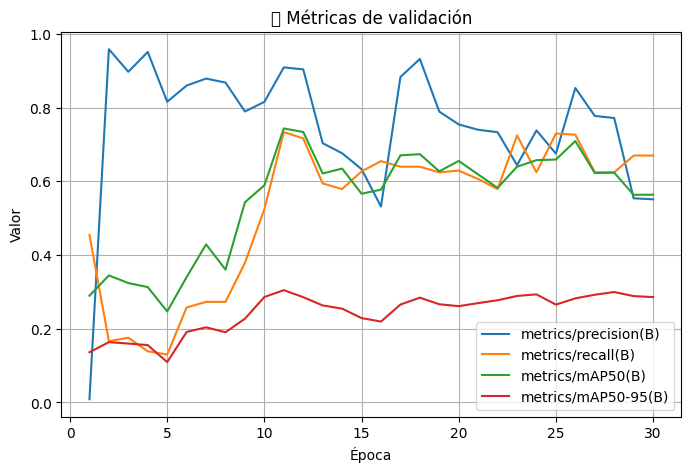

In [21]:
df[["epoch", "metrics/precision(B)", "metrics/recall(B)", "metrics/mAP50(B)", "metrics/mAP50-95(B)"]].plot(
    x="epoch", title="📈 Métricas de validación", figsize=(8,5)
)
plt.grid(True)
plt.xlabel("Época")
plt.ylabel("Valor")
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


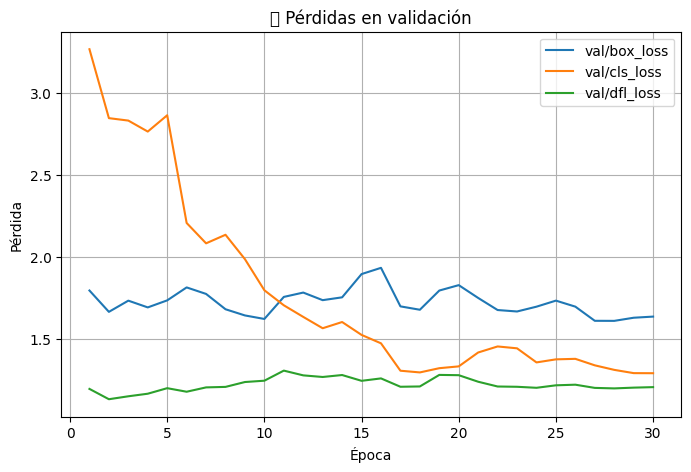

In [22]:
df[["epoch", "val/box_loss", "val/cls_loss", "val/dfl_loss"]].plot(
    x="epoch", title="📉 Pérdidas en validación", figsize=(8,5)
)
plt.grid(True)
plt.xlabel("Época")
plt.ylabel("Pérdida")
plt.show()
